In [1]:
import glob
import ast
import time
import numpy as np
import pandas as pd
from tqdm import tqdm 
import cv2
import json
import collections
from PIL import Image
import re
import joblib
import matplotlib.pyplot as plt
import gc
import zipfile

from tqdm import tqdm
import shutil

np.random.seed(42)

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Loading package

In [3]:
import sys
from pathlib import Path

here_path = Path().resolve()
repo_path = here_path.parents[1]
sys.path.append(str(repo_path))

In [4]:
from py.utils import verifyDir,verifyFile, verifyDataFrame

In [5]:
import os
from dotenv import load_dotenv
load_dotenv()

DATA_PATH = os.getenv('DATA_PATH')
MODEL_PATH = os.getenv('MODEL_PATH')
DATA_PATH, MODEL_PATH

('/media/felipe/DATA19/datasets/', '/media/felipe/DATA19/models/')

In [6]:
ML_TASK = "classifications"
MODEL_NAME = "RandomForest"
PRECEPTION_METRIC = "safety"

SEG_MODEL_NAME="OneFormer_Swin_Large"
SEG_DATASET="ade20k" # cityscapes
CITY_STUDIED = "Rio De Janeiro"

USE_UPD=True
FILTER_FEATURES=False
BY_GROUPS=False
BINARIZE_FEATURES=False

In [ ]:
QSCORE_PATH=f"{DATA_PATH}pp2/Qscores/"
IMAGES_PATH = f"{DATA_PATH}pp2/images/"

In [7]:
MODEL_DIR = f"{MODEL_PATH}"
MODEL_DIR += f"{SEG_DATASET}_upd4k" if USE_UPD else f"{SEG_DATASET}"
MODEL_DIR += "_group/" if BY_GROUPS else "/"
MODEL_DIR += "" if USE_UPD else f"{SEG_MODEL_NAME}/"
MODEL_DIR += f"{ML_TASK}/"

In [8]:
verifyDir(MODEL_DIR)

In [9]:
SEGMENT_DIR = f"{DATA_PATH}"
SEGMENT_DIR += "UrbanPhysicalDisorder/upd4k" if USE_UPD else f"pp2/segmentations/{SEG_DATASET}"
SEGMENT_DIR += "_group/" if BY_GROUPS else "/"
SEGMENT_DIR += "" if USE_UPD else f"{SEG_MODEL_NAME}/"

### Loading segmentations

In [10]:
from py.datasets import UrbanPhysicalDisorder

uss = UrbanPhysicalDisorder(data_path=DATA_PATH)
uss.generate_dataset(dataset = f"{SEG_DATASET}_upd4k" if USE_UPD else f"{SEG_DATASET}" )

In [11]:
seg_df = pd.read_csv(f"{SEGMENT_DIR}{CITY_STUDIED}/segmentations.csv", sep=";", low_memory=False)
seg_df["seg_image_path"] = f"{SEGMENT_DIR}" + seg_df["seg_image_path"]
seg_df["seg_overlay_image_path"] = f"{SEGMENT_DIR}" + seg_df["seg_overlay_image_path"]
seg_df["mask_path"] = f"{SEGMENT_DIR}" + seg_df["mask_path"]
seg_df["ratio_path"] = f"{SEGMENT_DIR}" + seg_df["ratio_path"]
seg_df

,image_id,seg_image_path,seg_overlay_image_path,mask_path,ratio_path,broken_damaged_pavement_road,building,car,door,fence,...,skyscraper,flower,ball,sink,swimming_pool,shelf,billiard,carpet,curtain,mirror
0,50f5ea5bfdc9f065f0007ab0,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,5.405000,5.768333,1.295000,0.860833,4.035833,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,50f5ea5bfdc9f065f0007ab1,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,0.000000,6.805000,7.540000,0.000000,0.901667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,50f5ea5bfdc9f065f0007ab2,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,0.000000,19.880833,0.271667,3.886667,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,50f5ea5bfdc9f065f0007ab3,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,0.000000,1.163333,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,50f5ea5bfdc9f065f0007ab4,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,0.000000,39.943333,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3639,50f5ec44fdc9f065f000890f,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,5.516667,18.544167,0.000000,0.000000,0.350833,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3640,50f5ec44fdc9f065f0008910,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,3.986667,35.478333,8.090000,0.000000,0.007500,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3641,50f5ec44fdc9f065f0008911,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,9.031667,25.838333,0.038333,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3642,50f5ec44fdc9f065f0008912,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,/media/felipe/DATA19/datasets/UrbanPhysicalDis...,7.010833,5.585833,0.670833,0.000000,7.335000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
segmentations_df = uss.process(seg_df, 
                               filter_features=FILTER_FEATURES, 
                               aggregate_classes=BY_GROUPS, 
                               binarize_values=BINARIZE_FEATURES,
                               keep_disorder=USE_UPD)
segmentations_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Columns: 113 entries, image_id to trashcan
dtypes: float64(108), str(5)
memory usage: 3.1 MB


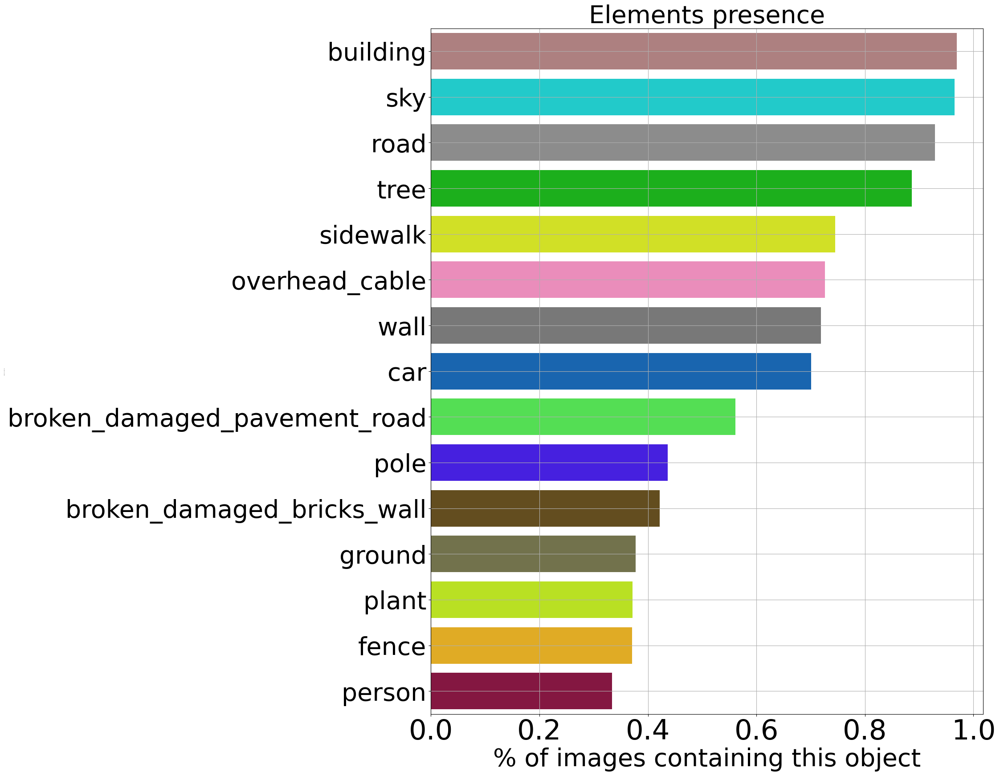

In [13]:
feature_presence = uss.features_presence(segmentations_df.iloc[:, 5:])
uss.print_object_present(feature_presence, fig_size=(16,20), top_k=15)

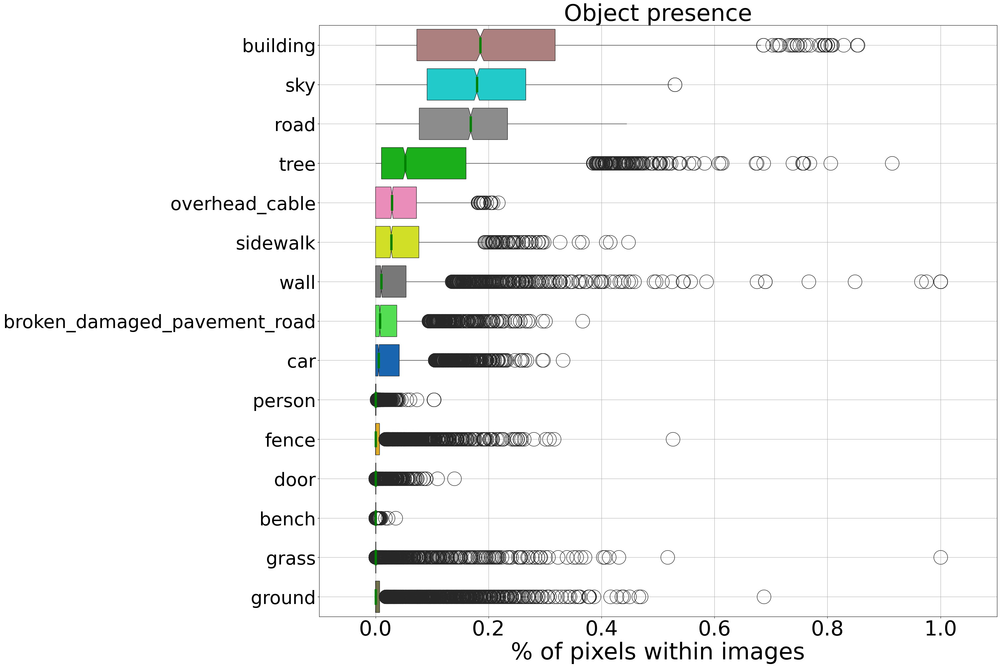

In [14]:
uss.print_object_boxplot(segmentations_df.iloc[:, 5:], fig_size=(30,20), top_k=15)

In [15]:
verifyDataFrame(segmentations_df)

Rows with all zeros: [], size: 0
Columns with all zeros: [], size: 0


### Loading data

In [16]:
%%time
scores_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
scores_df = scores_df[scores_df[PRECEPTION_METRIC]!=0.0].copy()
if CITY_STUDIED.lower() != "all":
    scores_df = scores_df[scores_df["city"]==CITY_STUDIED].copy()
scores_df["image_path"] = f"{IMAGES_PATH}" + scores_df["image_path"]
scores_df.sort_values(by=["safety"], ascending=False, inplace=True)
scores_df

CPU times: user 158 ms, sys: 35.9 ms, total: 194 ms
Wall time: 195 ms


,image_id,lat,long,city,country,continent,safety,beautiful,wealthy,lively,boring,depressing,image_path
22133,50f5eaecfdc9f065f0007e32,-22.901318,-43.178843,Rio De Janeiro,Brasil,South America,8.074111,7.222222,6.521164,5.259259,2.444444,5.000000,/media/felipe/DATA19/datasets/pp2/images/Rio D...
23068,50f5eb4bfdc9f065f00081e0,-22.924839,-43.387912,Rio De Janeiro,Brasil,South America,7.990805,3.015873,3.333333,3.767806,2.500000,2.261905,/media/felipe/DATA19/datasets/pp2/images/Rio D...
23210,50f5eb65fdc9f065f000826f,-22.829954,-43.374070,Rio De Janeiro,Brasil,South America,7.920455,3.740079,3.117284,3.333333,2.222222,5.000000,/media/felipe/DATA19/datasets/pp2/images/Rio D...
22917,50f5eb44fdc9f065f0008149,-22.946271,-43.371826,Rio De Janeiro,Brasil,South America,7.845118,5.000000,3.333333,3.347885,4.796296,5.555556,/media/felipe/DATA19/datasets/pp2/images/Rio D...
21422,50f5eaa3fdc9f065f0007b62,-22.848260,-43.265251,Rio De Janeiro,Brasil,South America,7.784127,2.222222,3.333333,4.777778,0.000000,4.500000,/media/felipe/DATA19/datasets/pp2/images/Rio D...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24004,50f5ebcefdc9f065f0008595,-22.875385,-43.278050,Rio De Janeiro,Brasil,South America,0.833333,2.190476,2.500000,1.929293,6.388889,6.314815,/media/felipe/DATA19/datasets/pp2/images/Rio D...
22692,50f5eb26fdc9f065f0008065,-22.912840,-43.252074,Rio De Janeiro,Brasil,South America,0.833333,3.574074,2.666667,2.893366,5.000000,7.296296,/media/felipe/DATA19/datasets/pp2/images/Rio D...
21777,50f5eac8fdc9f065f0007ccc,-22.775293,-43.391274,Rio De Janeiro,Brasil,South America,0.833333,2.500000,1.666667,5.274365,2.055556,7.619048,/media/felipe/DATA19/datasets/pp2/images/Rio D...
22717,50f5eb27fdc9f065f000807f,-22.853284,-43.319558,Rio De Janeiro,Brasil,South America,0.512821,3.333333,2.222222,4.174539,5.592593,6.333333,/media/felipe/DATA19/datasets/pp2/images/Rio D...


In [17]:
scores_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
dataset_df = pd.merge(scores_df, segmentations_df, on="image_id", how="inner")
dataset_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Columns: 125 entries, image_id to trashcan
dtypes: float64(116), str(9)
memory usage: 3.5 MB


Applying u and delta*std
u: 3.98674238014802 std: 1.1949709595772369
superior: 4.94271914780981 inferior: 3.0307656124862308
Top max: 8.07411071970459, min:4.944382985340158, size: 717
Bot max: 3.0303030303030303, min:0.4761904761904764, size: 722


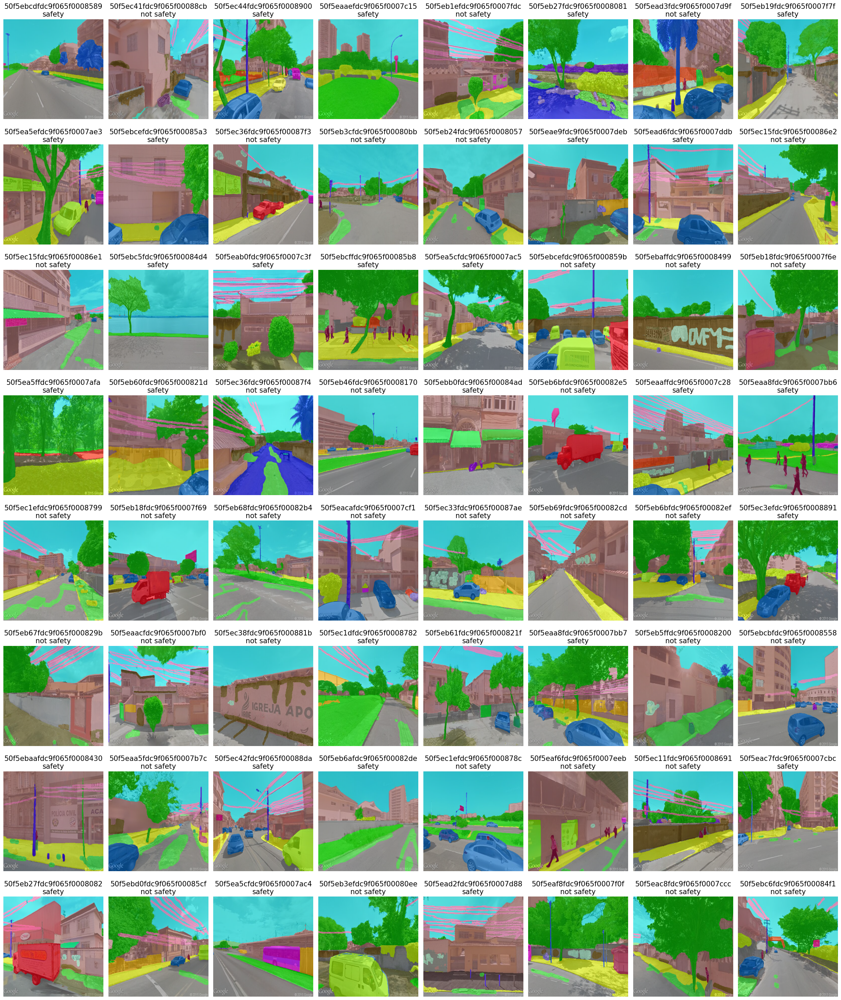

In [18]:
# Prepare data splits
from py.models.datasets import PlacePulse

pp = PlacePulse(dataset_df)
pp.DataPreparation(delta=0.8, emotion=PRECEPTION_METRIC, divide_by="std")
pp.TaskPreparation(task_type=ML_TASK)
pp.DataSplit()
pp.plot(img_to_show="seg_overlay_image_path")

### Loading model

In [19]:
from py.models.classification.ensemble import EnsembleClassifier

tm = EnsembleClassifier(model_name=MODEL_NAME, scaler_name="standard")
tm.model_zoo()
tm.initialize_grid()
tm.get_model()

Model zoo: ['DecisionTree', 'RandomForest', 'GradientBoosting', 'AdaBoost'] 



,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'classifier__bootstrap': [True], 'classifier__max_depth': [20], 'classifier__max_features': [None], 'classifier__min_samples_leaf': [3], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'balanced_accuracy'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",5
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",StratifiedKFo...shuffle=False)
,"verbose verbose: intControls the verbosity: the higher, the more me

### Training

In [20]:
feature_names = pp.train_df.iloc[:, 17:-2].columns.tolist()
X_train = pp.train_df.iloc[:, 17:-2].values
y_train = pp.train_df["target"].tolist()

X_test = pp.test_df.iloc[:, 17:-2].values
y_test = pp.test_df["target"].tolist()

In [21]:
len(feature_names), X_train.shape, X_test.shape

(108, (1079, 108), (360, 108))

In [22]:
collections.Counter(y_train), collections.Counter(y_test)

(Counter({0: 541, 1: 538}), Counter({0: 181, 1: 179}))

In [23]:
tm.model_grid.fit(X_train, y_train)

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'classifier__bootstrap': [True], 'classifier__max_depth': [20], 'classifier__max_features': [None], 'classifier__min_samples_leaf': [3], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'balanced_accuracy'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",5
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",StratifiedKFo...shuffle=False)
,"verbose verbose: intControls the verbosity: the higher, the more me

In [24]:
tm.model_grid.best_score_, tm.model_grid.best_params_

(np.float64(0.686652154169088),
 {'classifier__bootstrap': True,
  'classifier__max_depth': 20,
  'classifier__max_features': None,
  'classifier__min_samples_leaf': 3,
  'classifier__min_samples_split': 6,
  'classifier__n_estimators': 200})

In [25]:
from sklearn.metrics import classification_report

In [26]:
y_pred = tm.model_grid.predict(X_test)
test_report = classification_report(y_test, y_pred, output_dict=True)

print(classification_report(y_test, y_pred, target_names=list(pp.label_map.values())))

              precision    recall  f1-score   support

  not safety       0.69      0.75      0.72       181
      safety       0.72      0.66      0.69       179

    accuracy                           0.71       360
   macro avg       0.71      0.71      0.70       360
weighted avg       0.71      0.71      0.70       360



In [27]:
confusion_matrix = pd.crosstab(
    pd.Series([pp.label_map[k] for k in y_test], name="Real"),
    pd.Series([pp.label_map[k] for k in y_pred], name="Prediction")
)
confusion_matrix

Prediction,not safety,safety
Real,,
not safety,136,45
safety,61,118


### Feature Importance

In [28]:
import seaborn as sns

In [29]:
importances = tm.model_grid.best_estimator_[1].feature_importances_
# std = np.std([tree.feature_importances_ for tree in tm.model_grid.best_estimator_[1].estimators_], axis=0)

In [30]:
forest_importances = pd.Series(importances, index=feature_names)
forest_importances.sort_values(ascending=False, inplace=True)
forest_importances_df = forest_importances.to_frame()
forest_importances_df.reset_index(inplace=True)
forest_importances

broken_damaged_bricks_wall      0.112318
tree                            0.097191
broken_damaged_pavement_road    0.071024
road                            0.069717
overhead_cable                  0.069463
                                  ...   
mirror                          0.000000
carpet                          0.000000
broken_window                   0.000000
curtain                         0.000000
damaged_traffic_sign            0.000000
Length: 108, dtype: float64

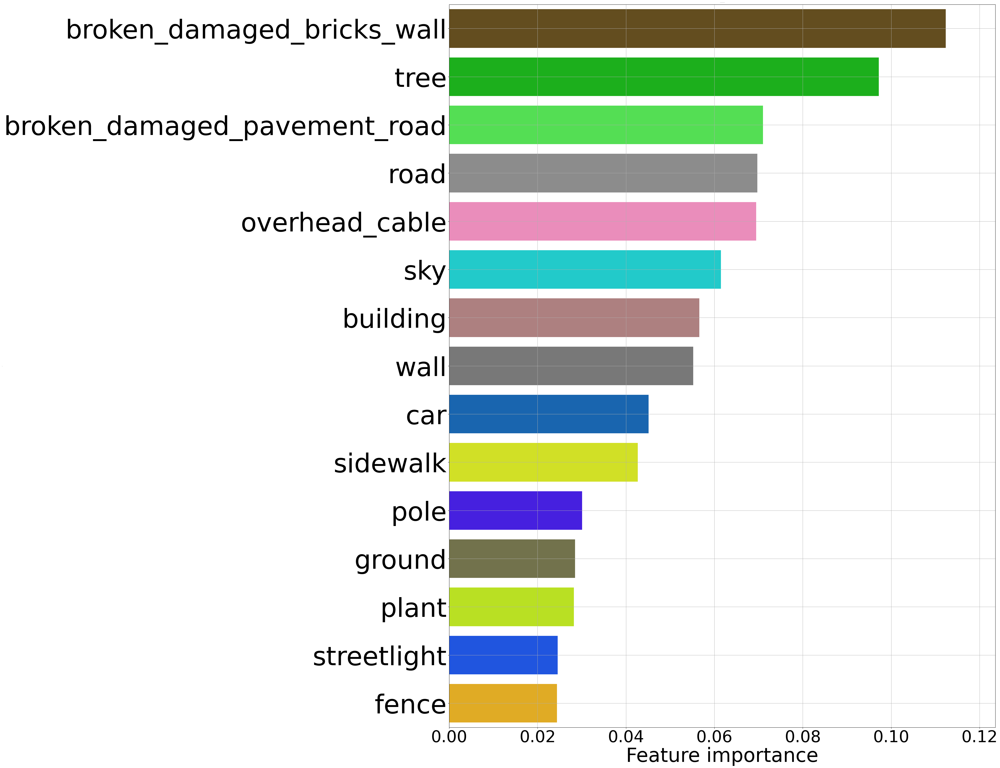

In [31]:
_, ax = plt.subplots(figsize=(30,40), nrows=1, ncols=1, sharex=False, sharey=False)

Top_k_features=15

sns_fig = sns.barplot(
            data=forest_importances_df.iloc[:Top_k_features],
            x=forest_importances_df.iloc[:Top_k_features].columns[1],
            y=forest_importances_df.iloc[:Top_k_features].columns[0],
            orient="h",
            ax=ax,
            palette=uss.color_dict,
            #order=estado_df.sort_values(estado_df.columns[1], ascending=False)[estado_df.columns[0]]
           )

sns_fig.set_title(f"Top {Top_k_features} feature importances", fontsize=0)
sns_fig.set_ylabel(f"Label", fontsize=0)
sns_fig.set_xlabel('Feature importance', fontsize=60)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=0, labelsize=50)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', labelsize=80)

# add annotation
# _ = sns_fig.bar_label(sns_fig.containers[0], fmt='%.4f', fontsize=15,rotation=0)
ax.grid(True)
# add a space on y for the annotations
sns_fig.margins(x=0.1)
plt.show()

### Saving data and model

In [32]:
OUT_NAME = f"{PRECEPTION_METRIC}"
OUT_NAME += "_filter" if FILTER_FEATURES else ""
OUT_NAME += "_bin" if BINARIZE_FEATURES else ""
OUT_NAME

'safety'

In [33]:
pp.data_df.to_csv(f"{MODEL_DIR}{OUT_NAME}_data.csv", sep=";", index=False)

In [34]:
pp.train_df.to_csv(f"{MODEL_DIR}{OUT_NAME}_data_train.csv", sep=";", index=False)

In [35]:
pp.test_df.to_csv(f"{MODEL_DIR}{OUT_NAME}_data_test.csv", sep=";", index=False)

In [36]:
joblib.dump(tm.model_grid, f'{MODEL_DIR}{OUT_NAME}_best.pkl')

['/media/felipe/DATA19/models/ade20k_upd4k/classifications/safety_best.pkl']

In [37]:
# with open(f'{MODEL_DIR}{OUT_NAME}_test_report.json', "w") as fp:
#     json.dump(test_report, fp)